In [1]:
import time

import torch
import einops
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data.dataset import random_split
from torch.utils.data import DataLoader, TensorDataset

from taker import Model
from huggingface_hub import InferenceClient
import numpy as np

import seaborn as sns
import phate
import matplotlib.pyplot as plt

In [2]:
prompt = "[INST] Please write an authentic italian pasta recipe, and include a few paragraphs description about a trip to italy that insipred it [/INST]"

output = """
Title: Spaghetti alle Vongole - A Taste of the Italian Coast

Recipe and Narrative by: [Your Name]

**Description:**

Spaghetti alle Vongole, or spaghetti with clams, is a classic Italian pasta dish hailing from the coastal regions of Italy. Its simple yet flavorful ingredients transport your palate to the Mediterranean, evoking memories of salty sea breezes, crystal-clear waters, sun-kissed villages, and bustling fish markets.

**Inspiration:**

My journey to Italy began on a crisp October morning, as I stepped off the plane and into the warm embrace of the Italian sun. I had longed for this adventure for years, dreaming of the vibrant colors, tantalizing aromas, and soul-stirring flavors that have become synonymous with Italian cuisine.

My itinerary led me to the picturesque town of Amalfi, nestled along the Amalfi Coast, renowned for its breathtaking vistas, stunning beaches, and the freshest seafood I could ever imagine. I spent my days wandering the narrow cobblestone streets, taking in the unforgettable views, and indulging in the exquisite culinary offerings of this coastal paradise.

At the heart of Amalfi's gastronomic scene was the local fish market. Each morning, I would make my way to the market as the sun began to rise, eager to witness the daily hustle and bustle, and to see the incredible array of seafood on offer. One particular vendor, a jovial fellow with a twinkle in his eye, always greeted me with a hearty "Buongiorno!" and a warm smile. He particularly emphasized the importance and abundance of vongole, or clams, in the local diet.

Curiosity piqued, I asked him to share his family's recipe for Spaghetti alle Vongole. With a gleam in his eye and a generous chuckle, he began to share not only the recipe but also the story behind the dish and the rich history of Italian coastal cooking.

**Recipe:**

**Ingredients:**

- 1 lb (454g) fresh spaghetti
- 1/4 cup (55g) extra-virgin olive oil
- 2 cloves garlic, minced
- 2 lbs (1kg) little neck clams, scrubbed and rinsed
- 2 tbsp fresh parsley, minced
- 2 tbsp fresh basil, chiffonade
- 1/2 cup (120ml) white wine
- Salt, to taste
- Black pepper, freshly ground, to taste
- Red pepper flakes (optional)
- 1 tbsp butter

**Directions:**

1. Bring a large pot of salted water to a rolling boil. Cook the spaghetti according to the package instructions until al dente. Drain, reserving about 1 cup of the cooking water.

2. In a large, deep skillet, heat the olive oil over medium heat. Add the minced garlic and cook, stirring constantly, for 1 minute or until lightly golden. Be careful not to burn the garlic.

3. Add the clams and toss to coat with the olive oil and garlic. Cook for a few minutes, allowing the clams to release their juices.

4. Pour the white wine into the pan and increase the heat to medium-high. Use a wooden spoon to stir the clams and dissolve any accumulated liquids on the bottom of the pan.

5. Once the white wine has mostly evaporated, add the drained spaghetti to the pan. Toss gently to coat the pasta in the clam juices and olive oil. Season with salt and pepper to taste.

6. Add enough reserved pasta water to create a sauce that evenly coats the spaghetti – the amount will depend on your personal preference.

7. Remove the pan from the heat and stir in the minced parsley and basil.

8. Dot the top of the pasta with small pats of butter, and sprinkle with red pepper flakes (if desired).

9. Serve immediately, garnished with additional minced herbs and freshly grated Parmesan or Pecorino Romano cheese.
"""

text1 = prompt + output
text = text1

loop_layers = [*list(range(0, 32, 4)), 31]

In [3]:

# x = np.random.randint(0, 1e7)

# client = InferenceClient(model="mistralai/Mistral-7B-Instruct-v0.2")
# prompt = "[INST] Please write an authentic italian pasta recipe, and include a few paragraphs description about a trip to italy that insipred it [/INST]"
# output = client.text_generation(prompt, max_new_tokens=1000, do_sample=True, temperature=1.0, seed=x)
# print(output)
# fill_text = prompt + output

In [4]:
prompt2 = "[INST] Please write an explanation a key detail about the start, middle, and end of world war 2 [/INST]"
# m.generate(prompt2, 1000)
output2 = " World War II was a global conflict that lasted from 1939 to 1945. It was the most widespread war in history, and it directly involved more than 100 million people from over 30 countries. Here are some key details about the start, middle, and end of World War II:\n\nStart of World War II:\nThe war began on September 1, 1939, when Germany, under Adolf Hitler, invaded Poland. Germany had been making territorial demands on Poland for some time, and the Poles refused to yield. In response, on August 23, 1939, Germany and the Soviet Union signed the Molotov-Ribbentrop Pact, which included a secret protocol for the partition of Poland between the two powers. On September 1, 1939, German troops crossed the border into Poland, marking the start of the war.\n\nMiddle of World War II:\nThe middle of World War II saw the entry of the United States into the war and the turning point of the war in Europe. The Japanese attack on Pearl Harbor on December 7, 1941, brought the United States into the war. After the initial shock of the attack, the US began to mobilize its resources and build up its military might. The tide of the war began to turn in Europe with the invasion of Sicily and Italy in July 1943, followed by the successful D-Day invasion of Normandy on June 6, 1944. The Soviet Union also played a crucial role in the middle of the war, making significant gains against Germany on the Eastern Front.\n\nEnd of World War II:\nThe end of World War II came in two main theaters of the war: Europe and the Pacific. In Europe, the war ended on May 7, 1945, when Germany signed an unconditional surrender. The official surrender ceremony took place on May 8, 1945, in Reims, France. In the Pacific, the war ended on September 2, 1945, when Japan signed its instrument of surrender on the USS Missouri in Tokyo Bay. The war in Europe ended with the unconditional surrender of Germany, while the war in the Pacific ended with the dropping of atomic bombs on Hiroshima and Nagasaki. The bombs were dropped on August 6 and August 9, 1945, respectively, and Japan formally surrendered on September 2, 1945. The end of the war marked the beginning of a new era in world history."
text2 = prompt2+output2
text = text2
print(text)

[INST] Please write an explanation a key detail about the start, middle, and end of world war 2 [/INST] World War II was a global conflict that lasted from 1939 to 1945. It was the most widespread war in history, and it directly involved more than 100 million people from over 30 countries. Here are some key details about the start, middle, and end of World War II:

Start of World War II:
The war began on September 1, 1939, when Germany, under Adolf Hitler, invaded Poland. Germany had been making territorial demands on Poland for some time, and the Poles refused to yield. In response, on August 23, 1939, Germany and the Soviet Union signed the Molotov-Ribbentrop Pact, which included a secret protocol for the partition of Poland between the two powers. On September 1, 1939, German troops crossed the border into Poland, marking the start of the war.

Middle of World War II:
The middle of World War II saw the entry of the United States into the war and the turning point of the war in Europ

In [5]:
# Generate activations if there are none
m = Model("mistralai/Mistral-7B-instruct-v0.2", dtype="nf4")
# m = Model(dtype="nf4")
m.do_activations["mlp_pre_out"] = False
m.do_activations["attn_pre_out"] = False

/workspace/nicky/taker/src/taker/model.py:175: UserWarning: Model mistralai/Mistral-7B-instruct-v0.2 not tested.
  warnings.warn( f"Model {model_repo} not tested." )


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

You are calling `save_pretrained` to a 4-bit converted model, but your `bitsandbytes` version doesn't support it. If you want to save 4-bit models, make sure to have `bitsandbytes>=0.41.3` installed.


- Loaded mistralai/Mistral-7B-instruct-v0.2
 - Registered 32 Attention Layers


In [18]:
# _in1, _attn1, _mlp1, _out1 = m.get_text_activations(text1)
_in2, _attn2, _mlp2, _out2 = m.get_text_activations(text2)
# _attn = torch.cat([_attn1, _attn2], dim=1)
_attn = _attn2

In [19]:
shape = _attn.shape[1]
print(shape)
new_shape = 16*(shape//16)
print(new_shape)
_attn = _attn[:, :new_shape ]


# labels1 = torch.zeros(_attn1.shape[1])
# labels1[0:37] = 1      # Instruction prompt
# labels1[37:71] = 2     # Title
# labels1[71:154] = 3    # Description
# labels1[154:518] = 4   # "Inspiration story"
# labels1[518:667] = 5   # Ingredients
# labels1[667:990] = 6   # Instructions (how to cook)
# labels1[990:1024] = 7  # Instructions (how to serve)

# color_values = labels1

labels2 = torch.zeros(_attn2.shape[1])
labels2[0:27] = 1 # Instructions
labels2[27:77] = 2 # Introduction
labels2[77:97] = 3 # Narrative
labels2[97:104] = 4 # Subtitle
labels2[105:228] = 5 # Description
labels2[229:237] = 6 # Subtitle
labels2[238:386] = 7 # Description
labels2[387:393] = 8 # Subtitle
labels2[394:533] = 9 # Description
labels2[533:588] = 10 # Description
# labels2[...] += torch.max(labels2)
color_values = labels2


# color_values=torch.cat([labels1, labels2]).int().numpy()[:new_shape]
# print(color_values.shape)

# color_values = np.linspace(0, 1, new_shape)

588
576


In [21]:
ids = m.get_ids(text2).flatten()
tokens = []
for i, _id in enumerate(ids):
    # print(f"{_id.cpu().item():5d} - {i:3d} - {m.tokenizer.decode(_id)}")
    token = m.tokenizer.decode(_id)
    print(f"{i:3d} - {token}")
    tokens.append(token)

  0 - <s>
  1 - [
  2 - INST
  3 - ]
  4 - Please
  5 - write
  6 - an
  7 - explanation
  8 - a
  9 - key
 10 - detail
 11 - about
 12 - the
 13 - start
 14 - ,
 15 - middle
 16 - ,
 17 - and
 18 - end
 19 - of
 20 - world
 21 - war
 22 - 
 23 - 2
 24 - [
 25 - /
 26 - INST
 27 - ]
 28 - World
 29 - War
 30 - II
 31 - was
 32 - a
 33 - global
 34 - conflict
 35 - that
 36 - lasted
 37 - from
 38 - 
 39 - 1
 40 - 9
 41 - 3
 42 - 9
 43 - to
 44 - 
 45 - 1
 46 - 9
 47 - 4
 48 - 5
 49 - .
 50 - It
 51 - was
 52 - the
 53 - most
 54 - widespread
 55 - war
 56 - in
 57 - history
 58 - ,
 59 - and
 60 - it
 61 - directly
 62 - involved
 63 - more
 64 - than
 65 - 
 66 - 1
 67 - 0
 68 - 0
 69 - million
 70 - people
 71 - from
 72 - over
 73 - 
 74 - 3
 75 - 0
 76 - countries
 77 - .
 78 - Here
 79 - are
 80 - some
 81 - key
 82 - details
 83 - about
 84 - the
 85 - start
 86 - ,
 87 - middle
 88 - ,
 89 - and
 90 - end
 91 - of
 92 - World
 93 - War
 94 - II
 95 - :
 96 - 

 97 - 

 98 - Star

ValueError: zero-size array to reduction operation fmin which has no identity

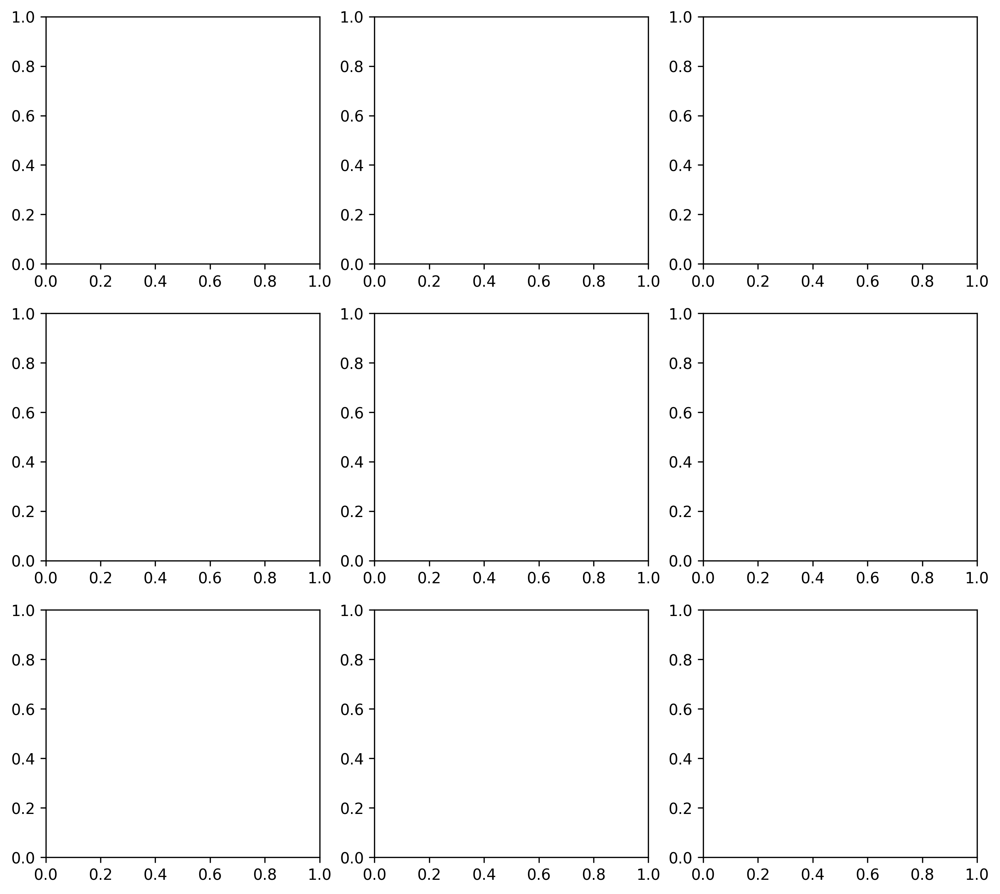

In [23]:

fig, axes = plt.subplots(3, 3, figsize=(11,10))


for j, layer_index in enumerate(loop_layers):
    div = 1
    _n = _attn.shape[1]
    dots = torch.zeros([_n, _n])
    vecs_i = _attn[layer_index]
    # _l, _r = 660,730
    # _l, _r = 506, 536
    fontsize = 6
    # vecs_i = vecs_i[_l:_r]
    vecs_i = vecs_i.reshape([-1, div, 4096]).mean(dim=1)
    vecs_j = vecs_i

    normed_vecs_i = vecs_i * (1 / torch.norm(vecs_i, dim=-1, keepdim=True))
    normed_vecs_j = vecs_j * (1 / torch.norm(vecs_j, dim=-1, keepdim=True))

    dots = vecs_i @ vecs_j.T
    coss = normed_vecs_i @ normed_vecs_j.T
    dist = torch.cdist(vecs_i, vecs_j)

    ax = axes[j//3, j%3]
    sns.heatmap(coss.detach().cpu().float(), ax=ax, square=True, center=0.0)
    # sns.heatmap(dots.detach().cpu().float(), ax=ax, square=True, center=0.0)
    # sns.heatmap(dist.detach().cpu().float(), ax=ax, square=True)
    ax.set_title(f"Layer {layer_index} CosSim (mean of {div})")

    tick_positions = np.arange(_l, _r)  # Positions every 100 units
    tick_labels =  [tokens[x] for x in tick_positions] # Positions every 100 units
    tick_positions = tick_positions - np.min(tick_positions) + 0.5
    # print(tick_positions)
    # print(tick_labels)
    ax.set_yticks(tick_positions, tick_labels, fontsize=fontsize)
    if j//3 == 2:
        ax.set_xticks(tick_positions, tick_labels, fontsize=fontsize)


plt.show()

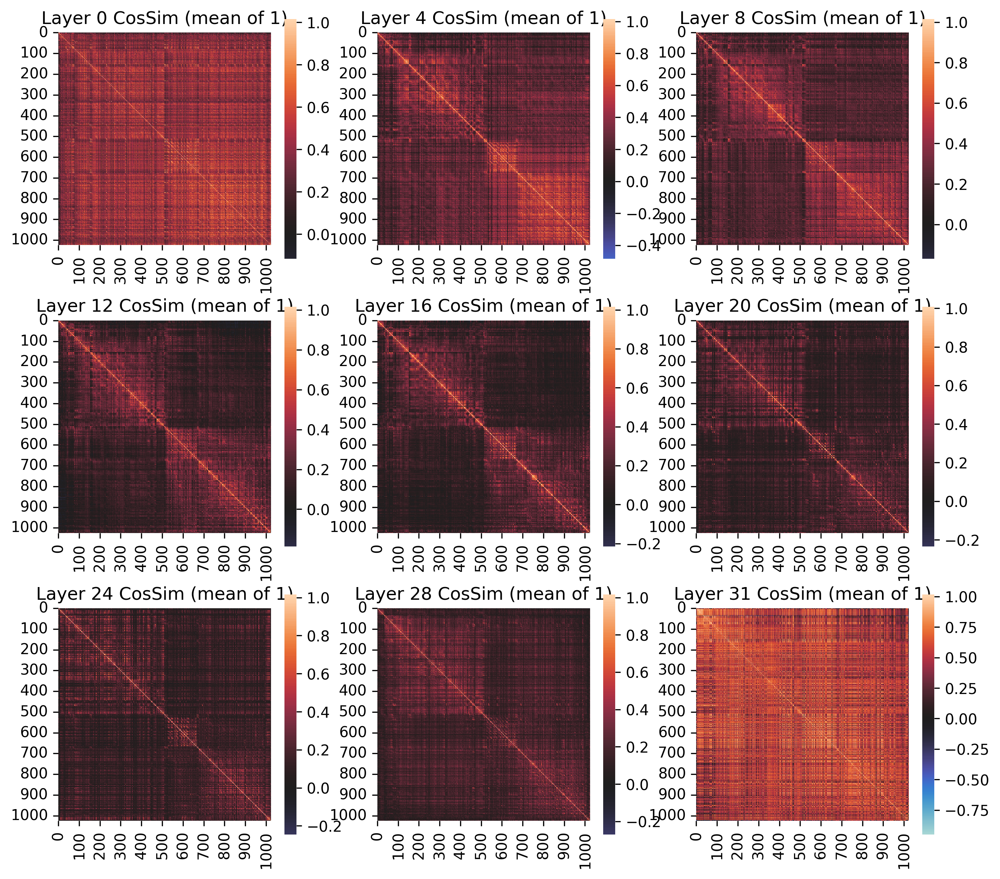

In [10]:
fig, axes = plt.subplots(3, 3, figsize=(11,10))


for j, layer_index in enumerate(loop_layers):
    div = 1
    _n = _attn.shape[1]
    dots = torch.zeros([_n, _n])
    vecs_i = _attn[layer_index]
    vecs_i = vecs_i.reshape([-1, div, 4096]).mean(dim=1)
    vecs_j = vecs_i

    normed_vecs_i = vecs_i * (1 / torch.norm(vecs_i, dim=-1, keepdim=True))
    normed_vecs_j = vecs_j * (1 / torch.norm(vecs_j, dim=-1, keepdim=True))

    dots = vecs_i @ vecs_j.T
    coss = normed_vecs_i @ normed_vecs_j.T
    dist = torch.cdist(vecs_i, vecs_j)

    ax = axes[j//3, j%3]
    sns.heatmap(coss.detach().cpu().float(), ax=ax, square=True, center=0.0)
    # sns.heatmap(dots.detach().cpu().float(), ax=ax, square=True, center=0.0)
    # sns.heatmap(dist.detach().cpu().float(), ax=ax, square=True)
    ax.set_title(f"Layer {layer_index} CosSim (mean of {div})")

    tick_positions = np.arange(0, coss.shape[1], 100/div)  # Positions every 100 units
    tick_labels =  [str(int(x*div)) for x in tick_positions] # Positions every 100 units
    # print(tick_positions)
    # print(tick_labels)
    ax.set_xticks(tick_positions, tick_labels)
    ax.set_yticks(tick_positions, tick_labels)


plt.show()

In [11]:

def make_9_plots(_attn, _fit_func, name="PHATE", normed=False):
    fig, axes = plt.subplots(3, 3, figsize=(11,10))
    sub_div = 1

    # Plotting the PHATE result


    # Initialize the PHATE operator
    for j, layer_index in enumerate(loop_layers):
        ax = axes[j//3, j%3]

        data = _attn[layer_index].reshape([-1, sub_div, 4096]).detach()
        if normed:
            data = data * (1 / torch.norm(data, dim=-1, keepdim=True))
            name += " normed"
        data = data.mean(dim=1).cpu().to(dtype=torch.float32)
        data_fitted = _fit_func(data)

        scatter = ax.scatter(data_fitted[:, 0], data_fitted[:, 1], c=color_values, cmap='Spectral', alpha=0.6)
        ax.set_title(f"{name} layer {layer_index}")
        if j // 3 == 2:
            ax.set_xlabel(f'{name} 1')
        if j % 3 == 0:
            ax.set_ylabel(f'{name} 2')
        cbar = fig.colorbar(scatter, ax=ax)
        # cbar.set_label('Point index')

    plt.show()

def fit_phate(data):
    # pip install phate
    import phate
    phate_op = phate.PHATE(verbose=False)
    data_phate = phate_op.fit_transform(data)
    return data_phate

def fit_tsne(data):
    from sklearn.manifold import TSNE
    tsne = TSNE(n_components=2, random_state=42)
    data_tsne = tsne.fit_transform(data)
    return data_tsne

def fit_umap(data):
    # pip install umap-learn
    import umap
    reducer = umap.UMAP(random_state=42)
    data_umap = reducer.fit_transform(data)
    return data_umap

def fit_pca(data):
    from sklearn.decomposition import PCA
    pca = PCA(n_components=2)
    data_pca = pca.fit_transform(data)
    return data_pca

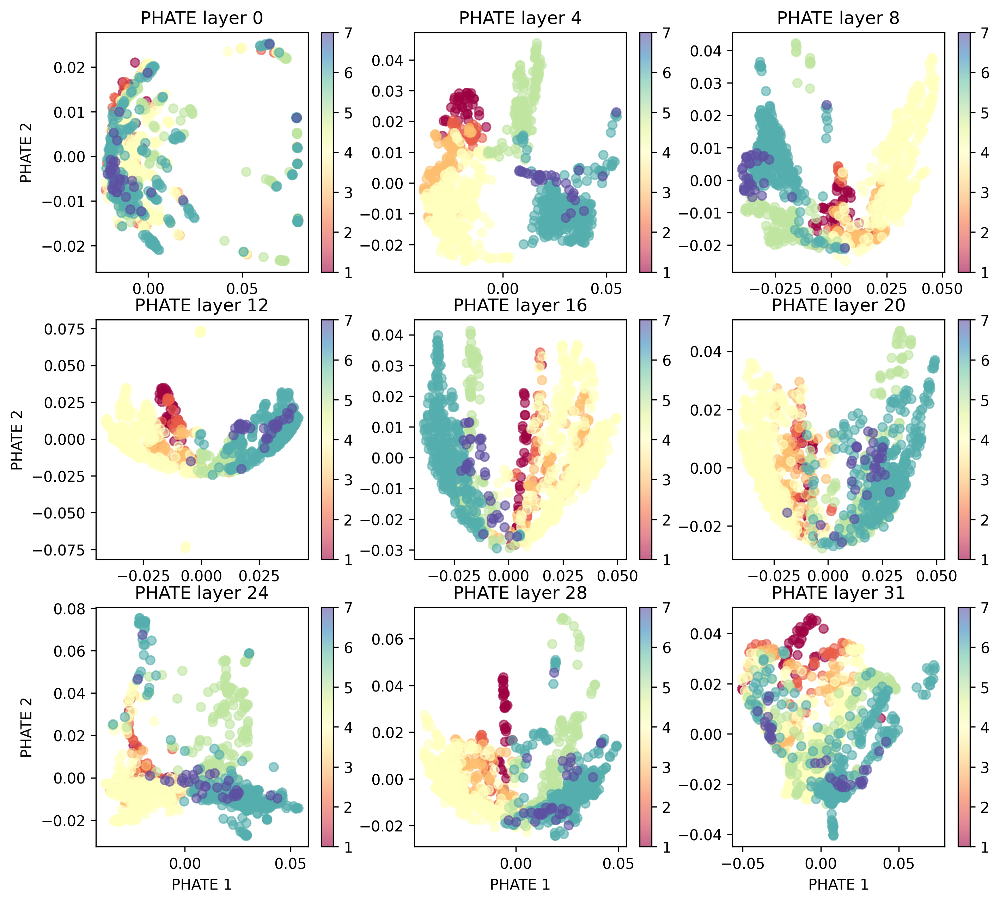

In [12]:
make_9_plots(_attn, fit_phate, name="PHATE", normed=False)

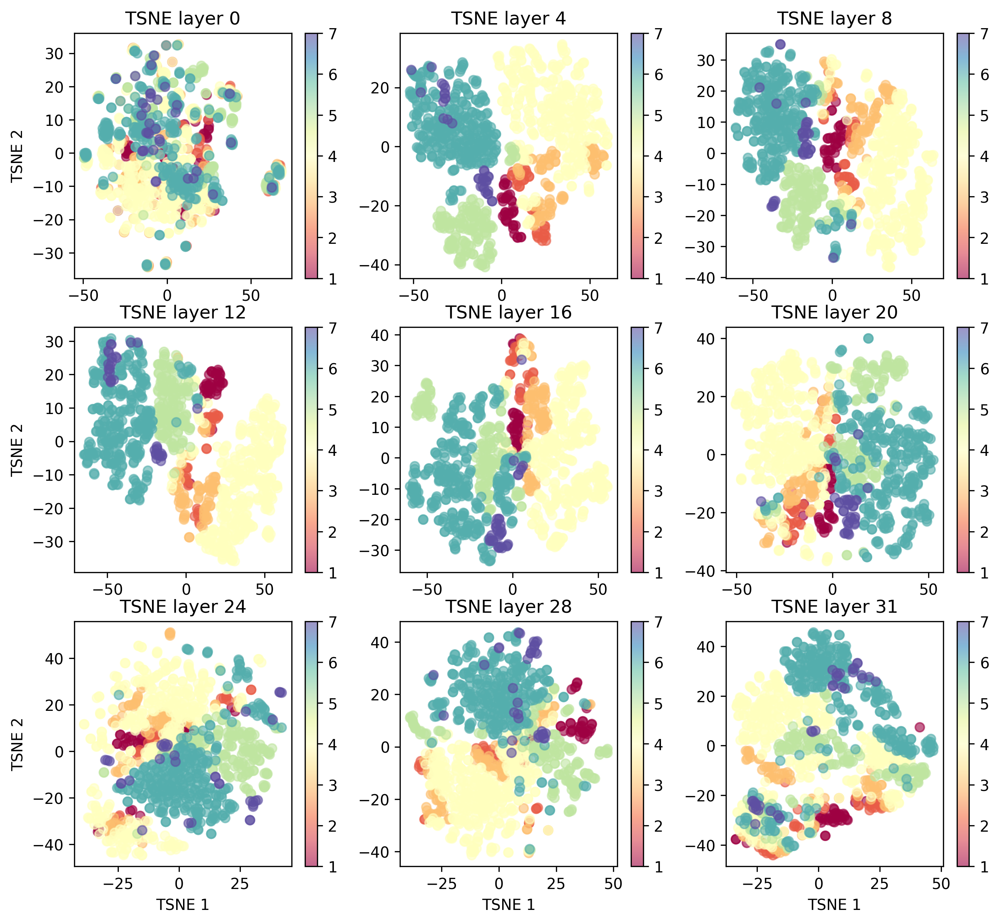

In [13]:
make_9_plots(_attn, fit_tsne, name="TSNE", normed=False)

/workspace/nicky/taker/.venv/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/workspace/nicky/taker/.venv/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/workspace/nicky/taker/.venv/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/workspace/nicky/taker/.venv/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. U

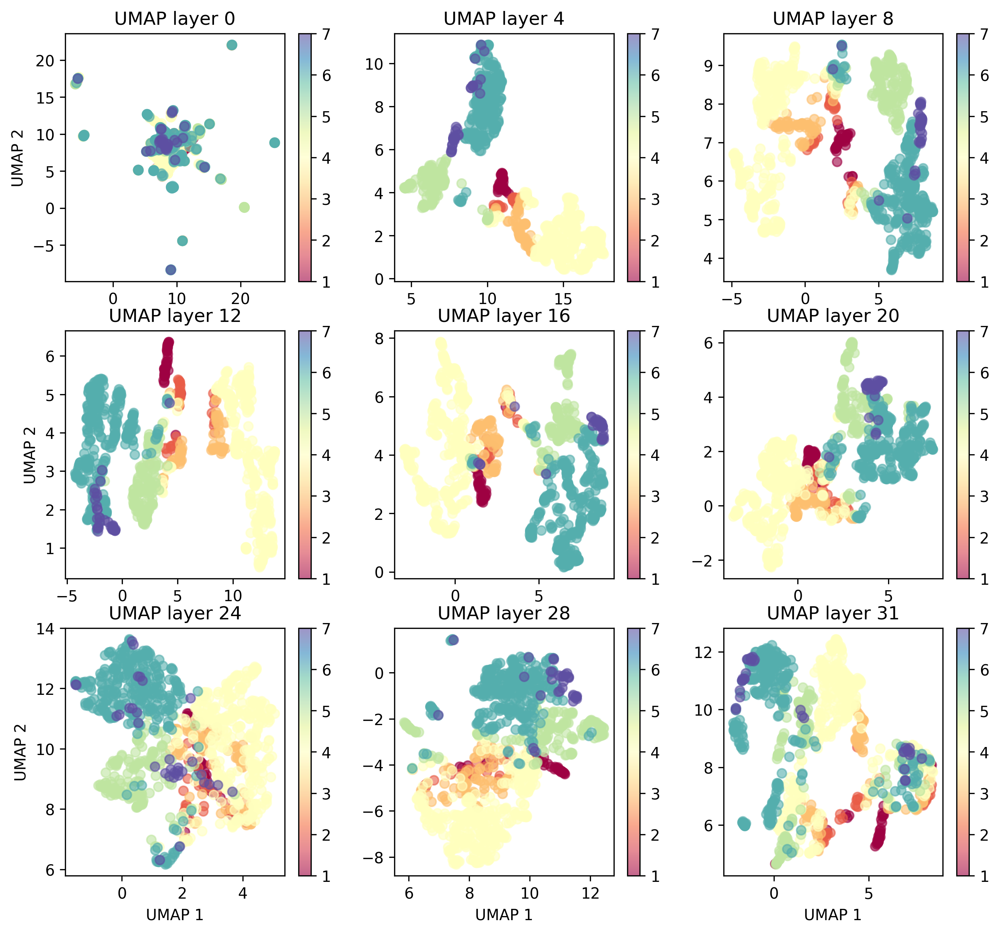

In [14]:
make_9_plots(_attn, fit_umap, name="UMAP", normed=False)

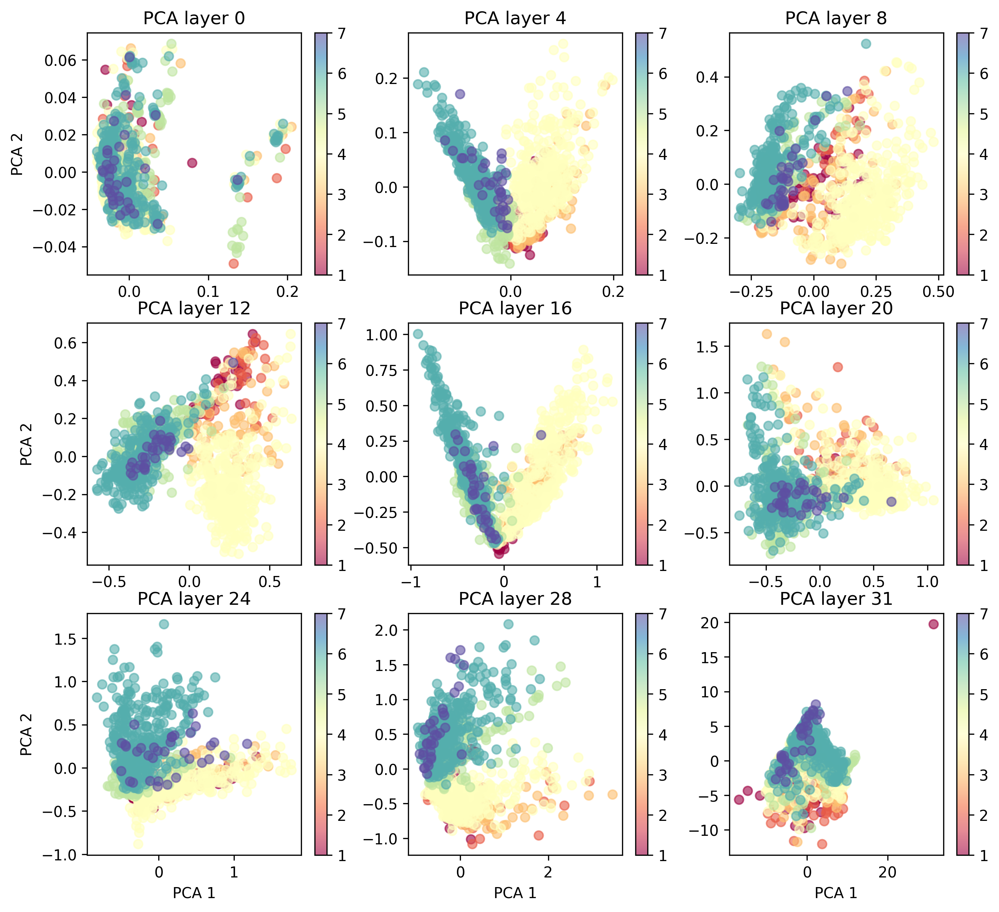

In [15]:
make_9_plots(_attn, fit_pca, name="PCA", normed=False)